# Сравнение различных моделей кластеризации

Случай, когда оптимальное число кластеров подбирается для каждой модели независимо.


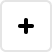
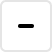
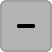
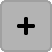
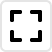
...
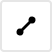
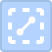
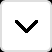
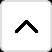
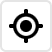

In [1]:
from itertools import product
from collections import namedtuple

import pandas as pd
from sklearn.metrics import mean_squared_error as error_metric

from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()

import os; import sys; sys.path.append(os.path.join(sys.path[0], ".."))
from util import util as u
from util import clustering_model as ucm
from util import transform_data as utd

In [2]:
def calc_char_general_orders(df, *, name="general_order"):
    result_s = utd.calc_char_orders(df).loc["order"]
    result_s.name = name
    return result_s

def calc_char_mean_orders(df, *, font_cols=["font_family", "font_size", "font_face"], name="mean_order"):
    result_s = utd.calc_char_orders(df, font_cols=font_cols).mean()
    result_s.name = name
    return result_s

def prepare_extended_char_data(cw_df, full_cw_df, t_s):
    c_data = ucm.prepare_char_data(cw_df, t_s)
    general_order_s = calc_char_general_orders(full_cw_df)
    mean_order_s = calc_char_mean_orders(cw_df, font_cols=["font_family"])
    general_mean_order_s = calc_char_mean_orders(full_cw_df, name="general_mean_order")
    return pd.concat([c_data, general_order_s, mean_order_s, general_mean_order_s], axis="columns")

def get_min_scored_cluster(df, *, min_coeff=2.0/3.0, model_col="model", n_clusters_col="n_clusters", score_col="score"):
    def calc_min_scored_cluster(r):
        min_value = r.max()
        for v in r.values:
            if v < min_coeff * min_value:
                min_value = v
        return min_value
    replace_s = df.sort_values(by=n_clusters_col).groupby(model_col)[score_col].agg(calc_min_scored_cluster)
    return df.score == df[model_col].replace(replace_s)

In [3]:
ModelType = namedtuple("ModelType", ["name", "clustering_col", "calc_cluster_size_method", "admixture_col"])

clustering_cols = ["width", "order", "general_order", "mean_order", "general_mean_order"]
calc_cluster_size_methods = [
    ("non_weighted", lambda r: r.width.mean()),
    ("weighted", None),
]
admixture_cols = [
    ("non_admixtured", None),
    ("admixtured", "alphabet"),
]

model_types = [
    ModelType("clustered_by_{0}-{1}-{2}".format(t[0], t[1][0], t[2][0]), t[0], t[1][1], t[2][1])
    for t in product(clustering_cols, calc_cluster_size_methods, admixture_cols)
]
print("Model types:\n\t{0}".format("\n\t".join([model_type.name for model_type in model_types])))

Model types:
	clustered_by_width-non_weighted-non_admixtured
	clustered_by_width-non_weighted-admixtured
	clustered_by_width-weighted-non_admixtured
	clustered_by_width-weighted-admixtured
	clustered_by_order-non_weighted-non_admixtured
	clustered_by_order-non_weighted-admixtured
	clustered_by_order-weighted-non_admixtured
	clustered_by_order-weighted-admixtured
	clustered_by_general_order-non_weighted-non_admixtured
	clustered_by_general_order-non_weighted-admixtured
	clustered_by_general_order-weighted-non_admixtured
	clustered_by_general_order-weighted-admixtured
	clustered_by_mean_order-non_weighted-non_admixtured
	clustered_by_mean_order-non_weighted-admixtured
	clustered_by_mean_order-weighted-non_admixtured
	clustered_by_mean_order-weighted-admixtured
	clustered_by_general_mean_order-non_weighted-non_admixtured
	clustered_by_general_mean_order-non_weighted-admixtured
	clustered_by_general_mean_order-weighted-non_admixtured
	clustered_by_general_mean_order-weighted-admixtured


In [4]:
full_char_widths_df = u.read_data("../data/full/char_widths.csv", monospaced=False)
char_widths_df = utd.filter_by_font(full_char_widths_df, filters=["size", "face"])
print(char_widths_df.shape)
char_widths_df.head()

(5768, 5)


,char_id,char,alphabet,font_family,width
0,32,,latin,Geneva,5
1,33,!,latin,Geneva,6
2,34,"""",latin,Geneva,7
3,35,#,latin,Geneva,11
4,36,$,latin,Geneva,11


In [5]:
full_control_df = u.read_data("../data/full/control.csv", monospaced=False)
control_df = utd.filter_by_font(full_control_df, filters=["size", "face"])
control_df = utd.train_test_split_by_column(control_df, "text", train_frac=.1)[0]
train_control_df, test_control_df = utd.train_test_split_by_column(control_df, "text")
print("control_df.shape={0}".format(control_df.shape))
print("train_control_df.shape={0}".format(train_control_df.shape))
print("test_control_df.shape={0}".format(test_control_df.shape))
control_df.head()

control_df.shape=(3528, 5)
train_control_df.shape=(2653, 5)
test_control_df.shape=(875, 5)


,text,width,alphabet,font_family,symbols_count
0,Low,35,latin,Geneva,3.0
1,Bar,29,latin,Geneva,3.0
2,Job,32,latin,Geneva,3.0
3,None,45,latin,Geneva,4.0
4,Rise,39,latin,Geneva,4.0


In [6]:
full_texts_df = u.read_data("../data/full/texts.csv", monospaced=False)
texts_df = full_texts_df[["text", "alphabet"]].drop_duplicates()
print(texts_df.shape)
texts_df.head()

(2000, 2)


,text,alphabet
0,Dog,latin
1,Ago,latin
2,Move,latin
3,Blue,latin
4,Push,latin


In [7]:
char_df = pd.concat([
    prepare_extended_char_data(
        char_widths_df[char_widths_df.alphabet == alphabet],
        full_char_widths_df[full_char_widths_df.alphabet == alphabet],
        texts_df[texts_df.alphabet == alphabet].text
    ).assign(alphabet=lambda r: alphabet)
    for alphabet in char_widths_df.alphabet.unique()
])
print(char_df.shape)
char_df.head()

(824, 7)


,width,weight,order,general_order,mean_order,general_mean_order,alphabet
char,,,,,,,
,5.285714,36117,11,1,13.571429,6.000000,latin
!,6.142857,1,30,20,27.142857,17.779762,latin
"""",7.571429,1,64,69,75.142857,77.244048,latin
#,11.714286,1,224,216,215.285714,178.202381,latin
$,11.000000,1,196,171,179.000000,147.803571,latin


In [8]:
clusters_df = pd.DataFrame(columns=["model", "n_clusters", "score"])
for model_type in model_types:
    for n_clusters in range(3, 13):
        model = ucm.ClusteringModel(
            clustering_col=model_type.clustering_col,
            calc_cluster_size=model_type.calc_cluster_size_method,
            n_clusters=n_clusters, random_state=42
        ).fit(char_df, admixture_col=model_type.admixture_col)
        clusters_df = pd.concat([clusters_df, pd.DataFrame({
            "model": [model_type.name],
            "n_clusters": [n_clusters],
            "score": [error_metric(train_control_df.width, model.predict(train_control_df.text))],
        })], ignore_index=True)
clusters_df["is_min_scored"] = get_min_scored_cluster(clusters_df)
clusters_df["color"] = clusters_df.is_min_scored.replace({True: "#e41a1c", False: "#377eb8"})
print(clusters_df.shape)
clusters_df.head()

(200, 5)


,model,n_clusters,score,is_min_scored,color
0,clustered_by_width-non_weighted-non_admixtured,3,548.630984,False,#377eb8
1,clustered_by_width-non_weighted-non_admixtured,4,337.347154,False,#377eb8
2,clustered_by_width-non_weighted-non_admixtured,5,234.761402,False,#377eb8
3,clustered_by_width-non_weighted-non_admixtured,6,247.267622,False,#377eb8
4,clustered_by_width-non_weighted-non_admixtured,7,244.822088,False,#377eb8


In [9]:
ggplot(clusters_df) + \
    geom_errorbar(aes(x=as_discrete("n_clusters", order=1), ymax="score", color="color"), \
                  ymin=0, show_legend=False) + \
    facet_wrap(facets="model", ncol=2) + \
    scale_color_identity() + \
    ylab("score") + \
    ggtitle("Зависимость ошибки предсказания от количества кластеров для разных моделей")

In [10]:
model_test_dfs = []
for model_type in model_types:
    best_n_clusters = clusters_df[(clusters_df.model == model_type.name)&(clusters_df.is_min_scored)].iloc[0].n_clusters
    model = ucm.ClusteringModel(
        clustering_col=model_type.clustering_col,
        calc_cluster_size=model_type.calc_cluster_size_method,
        n_clusters=best_n_clusters, random_state=42
    ).fit(char_df, admixture_col=model_type.admixture_col)
    model_test_dfs.append(
        test_control_df.assign(
            model=model_type.name,
            predicted_width=model.predict(test_control_df.text),
        )
    )
    predictor = model.predictor
    print("\n\nModel {0}:".format(model_type.name))
    for cluster in predictor.cluster.sort_values().unique():
        print("\tCluster #{0}:".format(cluster))
        print("\t\tWidth: {0}".format(predictor[predictor.cluster == cluster].iloc[0].cluster_width))
        print("\t\tChars with positive weight: {0}".format(
            list(predictor[(predictor.cluster == cluster)&(predictor.weight > 1)].index)
        ))
test_df = pd.concat(model_test_dfs)
test_df["prediction_error"] = test_df.predicted_width - test_df.width
test_df["prediction_mean_error"] = test_df.prediction_error / test_df.symbols_count
print(test_df.shape)
test_df.head()



Model clustered_by_width-non_weighted-non_admixtured:
	Cluster #0:
		Width: 4.956521739130435
		Chars with positive weight: [' ', 'i', 'j', 'l', 't', "'"]
	Cluster #1:
		Width: 6.589285714285714
		Chars with positive weight: ['Î', 'r', 'г', 'ï', 'î', 'f', 'I']
	Cluster #10:
		Width: 22.523809523809526
		Chars with positive weight: []
	Cluster #2:
		Width: 9.352733686067019
		Chars with positive weight: ['â', 'с', 'т', 'J', 'п', 'à', 'c', 'к', 'z', 'y', 'x', 'я', 'v', 's', 'э', 'ç', 'в', 'у', 'k', 'а', 'х', 'з', 'a']
	Cluster #3:
		Width: 10.68149882903981
		Chars with positive weight: ['d', 'е', 'д', 'б', 'о', 'ц', 'ч', 'ь', 'р', 'н', 'и', 'й', 'л', 'L', 'Г', 'è', 'é', 'ê', 'e', 'b', 'g', 'h', 'n', 'З', 'o', 'q', 'u', 'p', 'û', 'ô', 'ù']
	Cluster #4:
		Width: 12.225672877846792
		Chars with positive weight: ['ъ', 'Т', 'У', 'Р', 'Е', 'В', 'Б', 'Л', 'К', 'P', 'F', 'E', 'B', 'S', 'Ê', 'É', 'Y', 'T']
	Cluster #5:
		Width: 13.283643892339544
		Chars with positive weight: ['м', 'Э', 'Ч', '



Model clustered_by_general_order-non_weighted-non_admixtured:
	Cluster #0:
		Width: 9.843665768194072
		Chars with positive weight: [' ', 'С', 'Р', 'О', 'Л', 'К', 'З', 'Е', 'Г', 'В', 'Б', 'А', 'Т', 'У', 'Ч', 'ч', 'ц', 'х', 'у', 'т', 'с', 'р', 'п', 'о', 'н', 'м', 'л', 'й', 'и', 'з', 'е', 'д', 'г', 'в', 'б', 'а', 'Э', 'к', 'ъ', 'ь', 'я', 'э', 'Î', 'j', 'k', 'l', 'o', 'r', 's', 't', 'ô', 'ê', 'é', 'è', 'ç', 'J', 'î', 'I', 'ï', 'i', 'à', 'â', 'f', 'e', 'c', 'a', 'y', 'z', "'", 'v']
	Cluster #1:
		Width: 13.74021838034577
		Chars with positive weight: ['T', 'b', 'S', 'd', 'g', 'x', 'h', 'Ю', 'É', 'Ê', 'Ш', 'Ц', 'Х', 'Â', 'ф', 'ш', 'щ', 'ы', 'u', 'ю', 'ж', 'Ф', 'П', 'q', 'Н', 'М', 'p', 'И', 'Ж', 'n', 'Д', 'L', 'P', 'û', 'ù', 'F', 'E', 'A', 'B']
	Cluster #2:
		Width: 15.020833333333334
		Chars with positive weight: ['O', 'C', 'R', 'm', 'N', 'Q', 'H', 'U', 'V', 'K', 'W', 'Y', 'G', 'M', 'D', 'w']


Model clustered_by_general_order-non_weighted-admixtured:
	Cluster #0-0:
		Width: 10.0114285714



Model clustered_by_general_mean_order-non_weighted-non_admixtured:
	Cluster #0:
		Width: 7.109243697478992
		Chars with positive weight: [' ', 'к', 'з', 'е', 'г', 'I', 'î', 'с', 'у', 'l', 'j', 'i', 't', 'э', 'ь', 'ч', 'в', 'ï', 'а', "'"]
	Cluster #1:
		Width: 10.195714285714285
		Chars with positive weight: ['н', 'Î', 'Г', 'З', 'б', 'д', 'й', 'л', 'о', 'п', 'р', 'х', 'ц', 'я', 'и', 'r', 'f']
	Cluster #2:
		Width: 10.933766233766235
		Chars with positive weight: ['м', 'т', 'У', 'Т', 'ъ', 'А', 'Б', 'В', 'Е', 'К', 'Р', 'Э', 'à', 'â', 'ç', 'è', 'é', 's', 'ê', 'a', 'c', 'e', 'J', 'z']
	Cluster #3:
		Width: 12.418310970797158
		Chars with positive weight: ['b', 'g', 'k', 'n', 'o', 'h', 'L', 'ù', 'q', 'ы', 'ю', 'u', 'v', 'x', 'y', 'ф', 'û', 'Д', 'И', 'Л', 'Н', 'О', 'П', 'С', 'Ф', 'Х', 'Ц', 'Ч', 'ô']
	Cluster #4:
		Width: 14.104395604395604
		Chars with positive weight: ['É', 'B', 'Ê', 'Â', 'Ю', 'Ш', 'Ж', 'F', 'Y', 'S', 'T', 'A', 'P', 'E']
	Cluster #5:
		Width: 14.35230024213075
		Chars with

,text,width,alphabet,font_family,symbols_count,model,predicted_width,prediction_error,prediction_mean_error
0,Bar,29,latin,Geneva,3.0,clustered_by_width-non_weighted-non_admixtured,28,-1,-0.333333
1,Book,44,latin,Geneva,4.0,clustered_by_width-non_weighted-non_admixtured,43,-1,-0.250000
2,Trial,36,latin,Geneva,5.0,clustered_by_width-non_weighted-non_admixtured,38,2,0.400000
3,Garden,63,latin,Geneva,6.0,clustered_by_width-non_weighted-non_admixtured,62,-1,-0.166667
4,Best deal,80,latin,Geneva,9.0,clustered_by_width-non_weighted-non_admixtured,78,-2,-0.222222


In [11]:
ggplot(test_df) + \
    geom_point(aes("width", "predicted_width", color="alphabet"), alpha=.5) + \
    geom_abline(slope=1, color="black", size=1) + \
    facet_wrap(facets="model", ncol=2) + \
    scale_x_log10() + scale_y_log10() + \
    ggtitle("Отношение предсказанной ширины к реальной")

In [12]:
u.plot_matrix([
    ggplot(test_df[test_df.model == model]) + \
        geom_point(aes("symbols_count", "prediction_error", color="alphabet")) + \
        geom_smooth(aes("symbols_count", "prediction_error", color="alphabet")) + \
        geom_hline(yintercept=0, color="magenta") + \
        facet_wrap(facets="font_family", ncol=4) + \
        ggtitle("График абсолютной ошибки для {0}".format(model))
    for model in test_df.model.unique()
], width=800, height=400, columns=1)

In [13]:
u.plot_matrix([
    ggplot(test_df[test_df.model == model]) + \
        geom_density(aes(x="prediction_mean_error", color="alphabet"), size=2) + \
        geom_vline(xintercept=0, color="magenta") + \
        facet_wrap(facets="font_family", ncol=4) + \
        ggtitle("Плотность распределения средней ошибки для {0}".format(model))
    for model in test_df.model.unique()
], width=800, height=400, columns=1)